In [1]:
!mkdir -p ~/.kaggle
!cp kaggle.json ~/.kaggle
!chod 600 ~/.kaggle/kaggle.json

/bin/bash: line 1: chod: command not found


In [2]:
!pip install opendatasets

In [3]:
import opendatasets as od
od.download("https://www.kaggle.com/datasets/julinmaloof/the-oxfordiiit-pet-dataset?select=images")

Dataset URL: https://www.kaggle.com/datasets/julinmaloof/the-oxfordiiit-pet-dataset


100%|██████████| 777M/777M [00:07<00:00, 109MB/s]


In [4]:
!pip install torchmetrics

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 961.5/961.5 kB 59.8 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 363.4/363.4 MB 4.1 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 13.8/13.8 MB 107.2 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 24.6/24.6 MB 98.0 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 883.7/883.7 kB 58.1 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 664.8/664.8 MB 1.1 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 211.5/211.5 MB 5.6 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 56.3/56.3 MB 13.4 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 127.9/127.9 MB 7.6 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 207.5/207.5 MB 5.3 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 21.1/21.1 MB 82.0 MB/s eta 0:00:00
  Attempting uninstall: nvidia-nvjitlink-cu12
    Found existing installation: nvidia-nvjitlink-cu12 12.5.82
    Uninstal

In [5]:
!pip install segmentation_models_pytorch

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 154.8/154.8 kB 12.1 MB/s eta 0:00:00


In [6]:
import numpy as np
import cv2 as cv
import matplotlib.pyplot as plt
import torch
from torch.utils.data import Dataset, DataLoader
from torchvision.transforms import Compose, ToTensor, Resize
from torchmetrics.classification import BinaryAccuracy
import albumentations as A
from albumentations.pytorch import ToTensorV2

import os
from tqdm import tqdm
from glob import glob
import argparse
import torch.optim as optim
from torch import optim, nn
import segmentation_models_pytorch as smp
from torchmetrics.segmentation import GeneralizedDiceScore, MeanIoU
import warnings
from PIL import Image
warnings.filterwarnings("ignore")

/usr/local/lib/python3.11/dist-packages/albumentations/__init__.py:28: UserWarning: A new version of Albumentations is available: '2.0.7' (you have '2.0.6'). Upgrade using: pip install -U albumentations. To disable automatic update checks, set the environment variable NO_ALBUMENTATIONS_UPDATE to 1.
  check_for_updates()


In [7]:
class PetDataset(Dataset):
  def __init__(self, root ="/content/the-oxfordiiit-pet-dataset", is_train=True, transform=None):
    self.transform = transform
    self.calsses = ['background', 'animal']
    self.root = root

    if is_train:
      annotations = os.path.join(root, "annotations", "trainval.txt")
    else:
      annotations = os.path.join(root, "annotations", "test.txt")

    with open(annotations, 'r') as file:
      self.img_names = [image.split(' ')[0] for image in file.readlines()]

  def __len__(self):
    return len(self.img_names)

  def __getitem__(self, index):
    img_name = self.img_names[index]
    img_path  = os.path.join(self.root, "images", img_name ) + ".jpg"
    mask_path  = os.path.join(self.root, "annotations", "trimaps", img_name) + ".png"

    image = cv.imread(img_path)
    image = cv.cvtColor(image, cv.COLOR_BGR2RGB)

    mask = cv.imread(mask_path, cv.IMREAD_GRAYSCALE)
    mask[mask == 2] = 0
    mask[mask == 3] = 1

    if self.transform:
      transformed = self.transform(image=image, mask=mask)
      image = transformed['image']
      mask = transformed['mask']
      mask = mask.float()
    return image, mask



Image Shape :  (500, 375, 3)
Mask Shape :  (500, 375)
Mask unique:  [0 1]


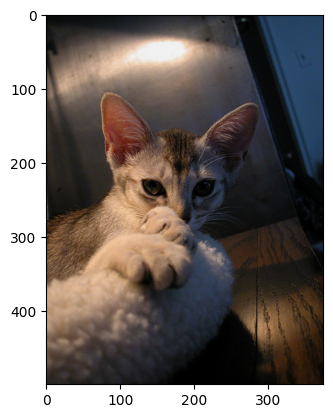

In [8]:
petdataset = PetDataset()
img, mask = petdataset[10]
print("Image Shape : ", img.shape)
print("Mask Shape : ", mask.shape)
print("Mask unique: ", np.unique(mask))
plt.imshow(img)


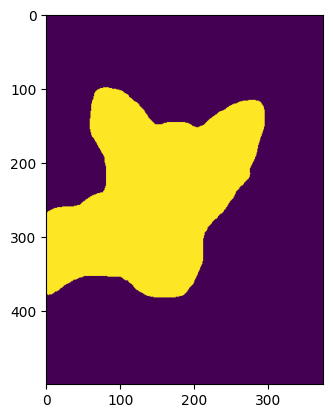

In [9]:
plt.imshow(mask)

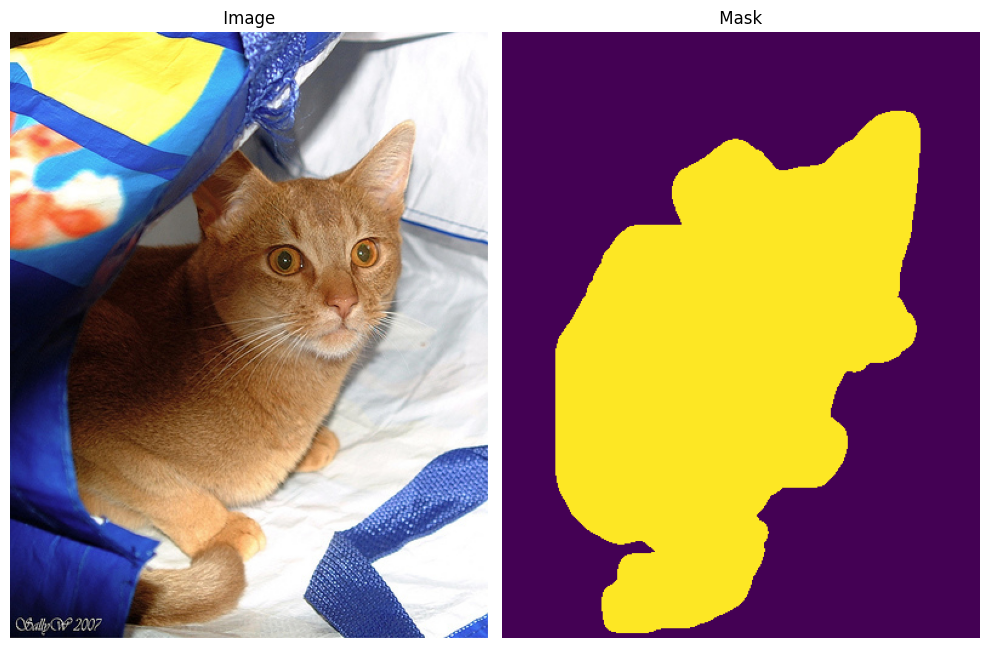

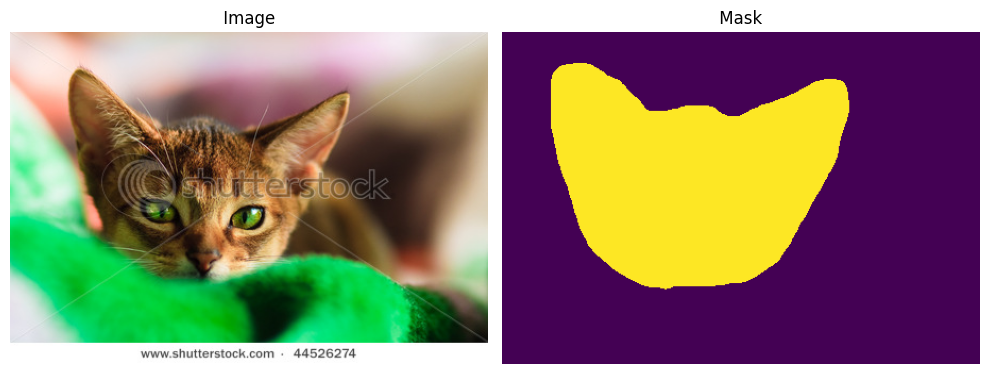

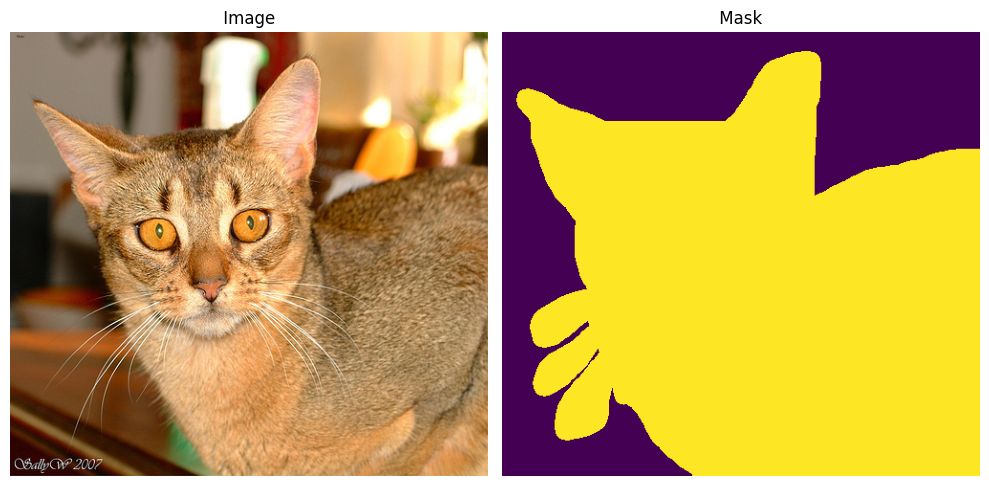

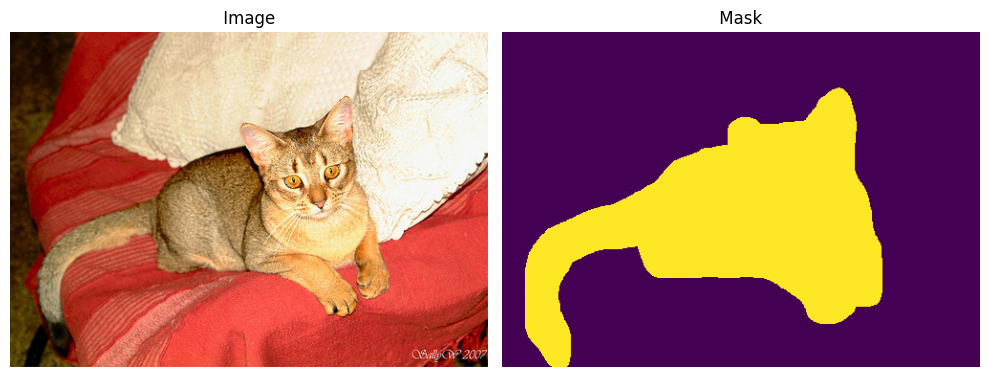

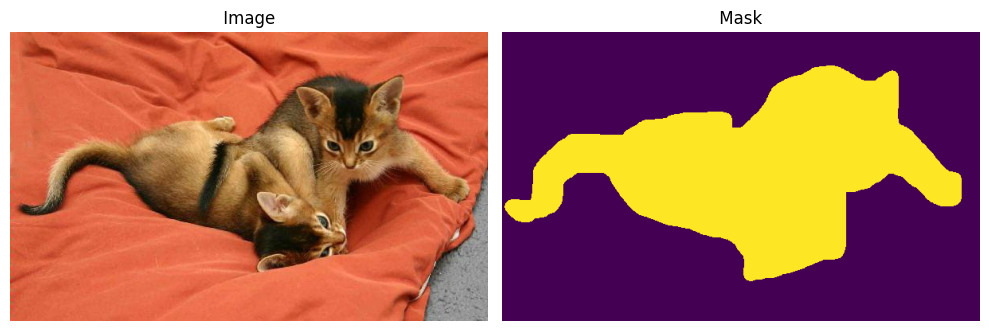

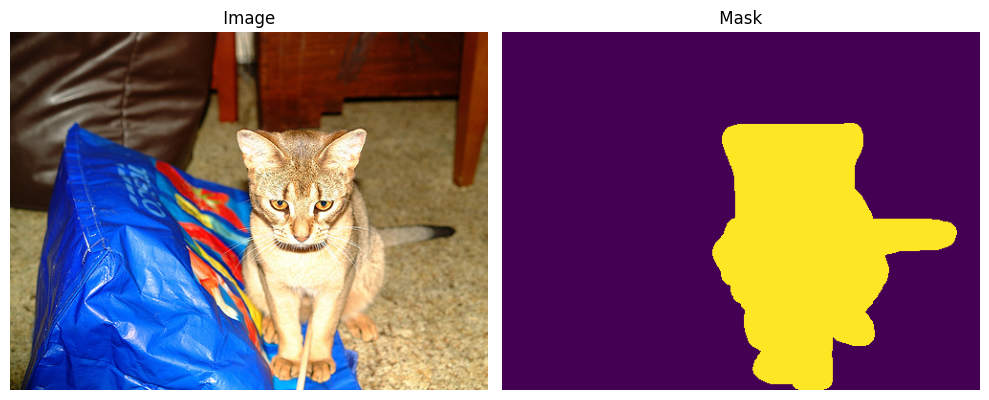

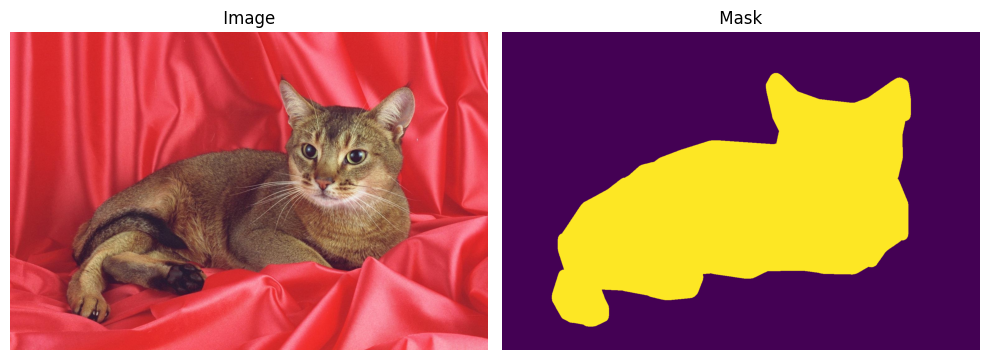

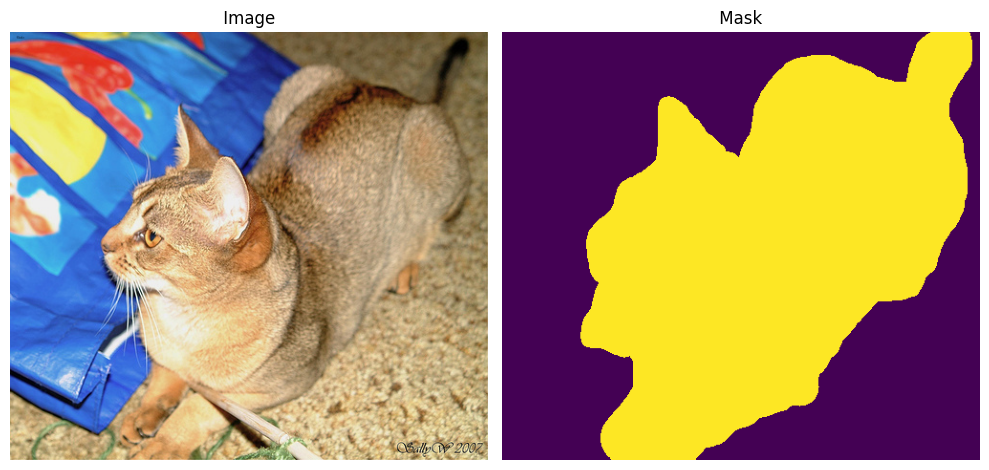

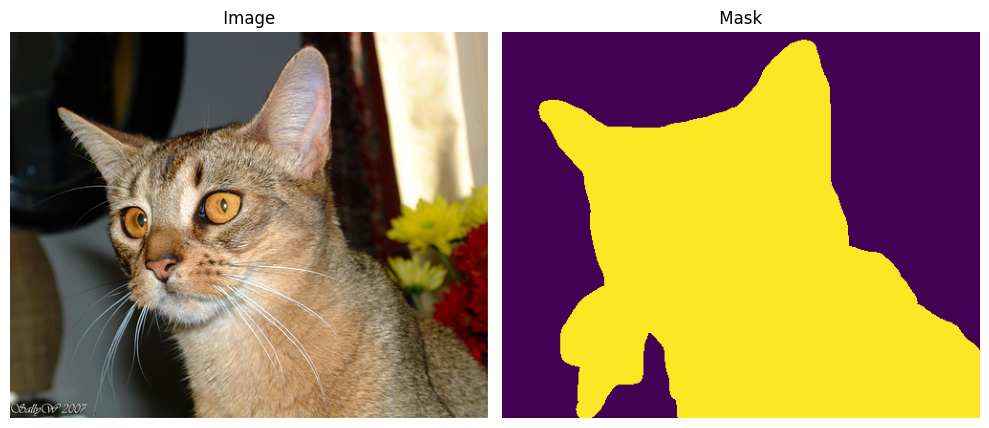

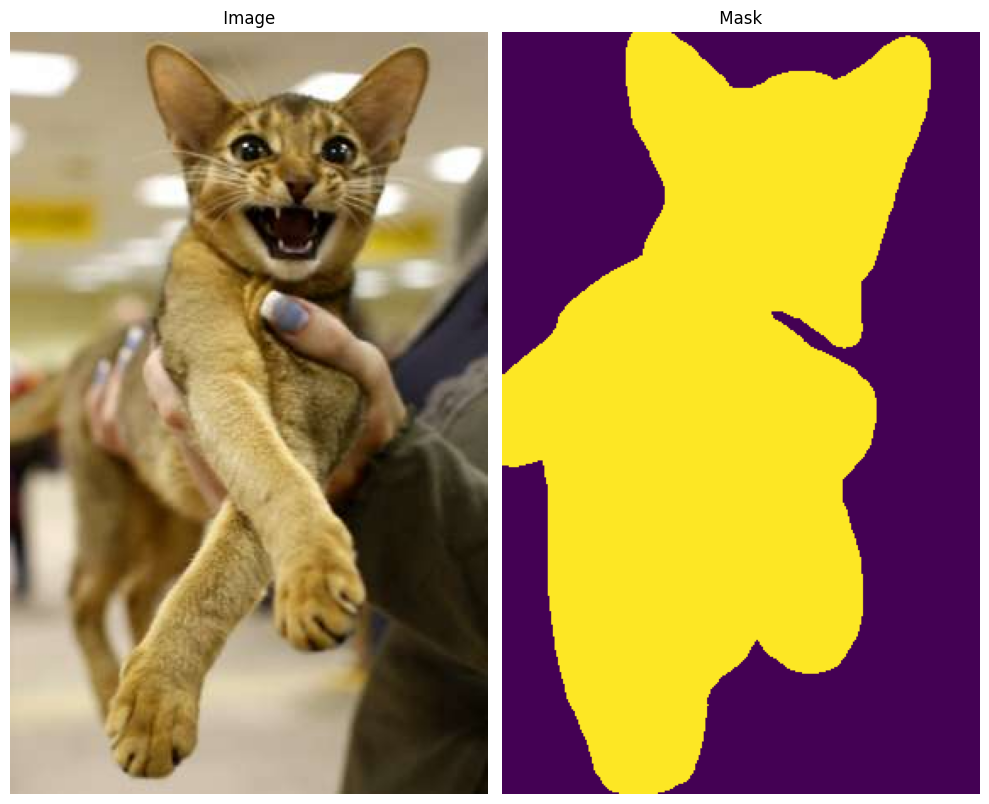

In [10]:
for i in range(10):
  img, mask = petdataset[i]

  plt.figure(figsize=(10,10))

  plt.subplot(1,2,1)
  plt.imshow(img)
  plt.title(" Image ")
  plt.axis('off')


  plt.subplot(1,2,2)
  plt.imshow(mask)
  plt.title(" Mask ")
  plt.axis('off')
  plt.tight_layout()
  plt.show()

In [11]:
train__transform = A.Compose([
    A.Resize(width=224, height=224),
    A.HorizontalFlip(),
    A.RandomBrightnessContrast(),
    A.Blur(),
    A.Sharpen(),
    A.RGBShift(),
    A.Normalize(mean=(0.485, 0.456, 0.406), std=(0.229, 0.224, 0.225)), # Add Normalize to convert to float32 and normalize
    ToTensorV2()

  ])

test_transform = A.Compose([
    A.Resize(width=224, height=224),
    A.Normalize(mean=(0.485, 0.456, 0.406), std=(0.229, 0.224, 0.225)), # Add Normalize to convert to float32 and normalize
    ToTensorV2()
])

In [12]:
train_dataset = PetDataset("/content/the-oxfordiiit-pet-dataset", is_train=True, transform = train__transform)

val_dataset = PetDataset("/content/the-oxfordiiit-pet-dataset", is_train=False, transform = test_transform)


In [13]:
  train_dataloader = DataLoader(dataset=train_dataset, batch_size=10, shuffle=True, drop_last=True)
  val_dataloader = DataLoader(dataset=val_dataset, batch_size=10, shuffle=False, drop_last=True)

In [14]:
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

model = smp.Unet(encode_name='resnet', encoder_weights='imagenet', in_channels=3, classes=1)
model.to(device)
criterion = nn.BCEWithLogitsLoss()
optimizer = optim.Adam(model.parameters(), lr = 0.0001)


config.json:   0%|          | 0.00/156 [00:00<?, ?B/s]

model.safetensors:   0%|          | 0.00/87.3M [00:00<?, ?B/s]

In [ ]:
def train_model(model, train_loader, epochs):
    model.train()  # Set model to training mode
    for epoch in range(epochs):
        total_loss = 0
        total_pixel = 0
        correct_pixel = 0

        for image, mask in train_loader:
            image, mask = image.to(device), mask.to(device)
            optimizer.zero_grad()  # Reset gradients
            output = model(image)

            # Ensure mask has a channel dimension
            mask = mask.unsqueeze(1)
            loss = criterion(output, mask)
            loss.backward()
            optimizer.step()

            total_loss += loss.item()
            pred = torch.sigmoid(output)
            pred = (pred > 0.5).float()

            correct_pixel += (pred == mask).sum().item()
            total_pixel += torch.numel(mask)

        avg_loss = total_loss / len(train_loader)
        accuracy = correct_pixel / total_pixel  # ✅ Corrected accuracy calculation
        print(f'Epoch [{epoch+1}/{epochs}], Loss: {avg_loss:.4f}, Accuracy: {accuracy:.4f}')

train_model(model, train_dataloader, 20)


Epoch [1/20], Loss: 0.0540, Accuracy: 0.9775


In [16]:
def evaluate_model(model, val_loader):
    model.eval()
    test_loss = 0.0
    total_pixels = 0
    correct_pixels = 0

    with torch.no_grad():
        for images, masks in val_loader:
            images, masks = images.to(device), masks.to(device)

            outputs = model(images)  # raw logits
            # Add channel dimension to the mask to match model output shape
            masks = masks.unsqueeze(1)

            loss = criterion(outputs, masks)
            test_loss += loss.item()

            preds = torch.sigmoid(outputs)               # apply sigmoid to get probabilities
            preds = (preds > 0.5).float()                # threshold to get binary mask

            correct_pixels += (preds == masks).sum().item()
            total_pixels += torch.numel(masks)

    avg_loss = test_loss / len(val_loader)
    accuracy = correct_pixels / total_pixels

    print(f"Test Loss: {avg_loss:.2f}")
    print(f"Test Accuracy: {accuracy:.2f}")
    torch.save(model.state_dict(),"best_model.pth")

evaluate_model(model, val_dataloader)

Test Loss: 0.11
Test Accuracy: 0.96


In [17]:

def infer_and_visualize(model, image_path, device, transform):
    image = cv.imread(image_path)
    image = cv.cvtColor(image, cv.COLOR_BGR2RGB)

    # Apply albumentations transform
    transformed = transform(image=image)
    image_tensor = transformed['image'].unsqueeze(0).to(device)  # Add batch dim

    with torch.no_grad():
        output = model(image_tensor)
        output = torch.sigmoid(output).cpu().squeeze().numpy()
        output = (output > 0.5).astype(np.uint8)

        plt.figure(figsize=(10, 5))
        plt.subplot(1, 3, 1)
        plt.title("Original Image")
        plt.imshow(image)

        plt.subplot(1, 3, 2)
        plt.title("Mask")
        plt.imshow(output)

        plt.subplot(1, 3, 3)
        plt.title("Overlap")
        plt.imshow(image)
        plt.imshow(output, cmap='jet', alpha=0.5)
        plt.show()

In [18]:
model.load_state_dict(torch.load("/content/best_model.pth"))
model.eval()

Unet(
  (encoder): ResNetEncoder(
    (conv1): Conv2d(3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False)
    (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (relu): ReLU(inplace=True)
    (maxpool): MaxPool2d(kernel_size=3, stride=2, padding=1, dilation=1, ceil_mode=False)
    (layer1): Sequential(
      (0): BasicBlock(
        (conv1): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
        (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
        (relu): ReLU(inplace=True)
        (conv2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
        (bn2): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      )
      (1): BasicBlock(
        (conv1): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
        (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track

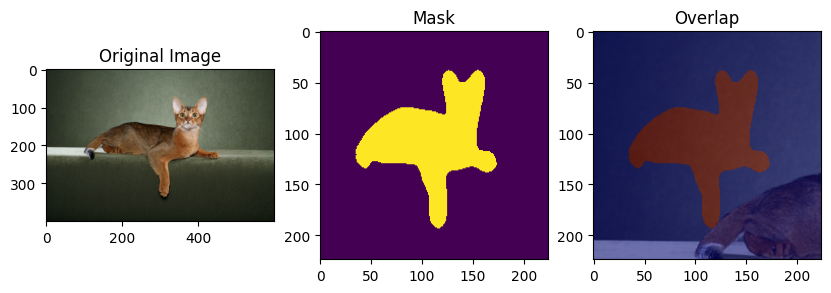

In [20]:
sample_image = "/content/the-oxfordiiit-pet-dataset/images/Abyssinian_1.jpg"
infer_and_visualize(model,sample_image,device, test_transform)

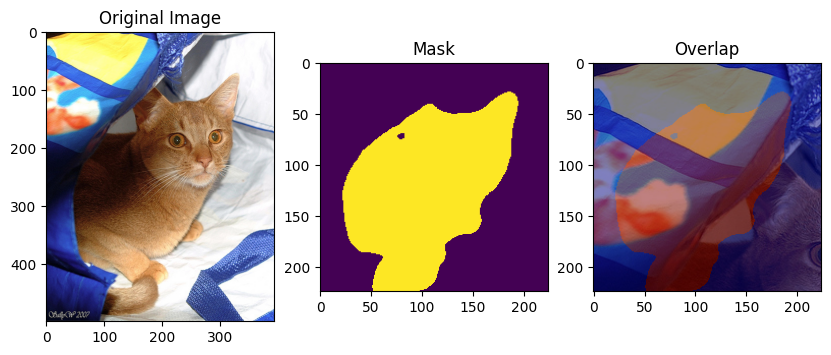

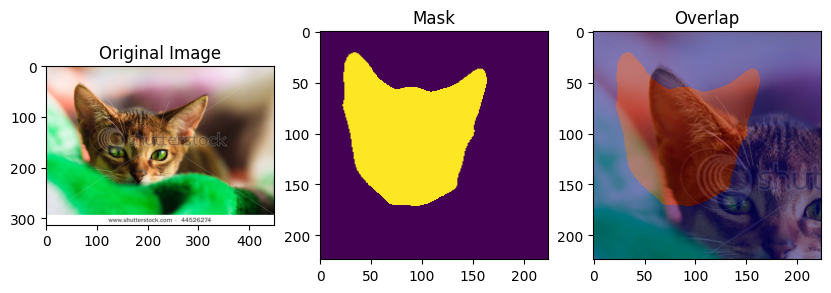

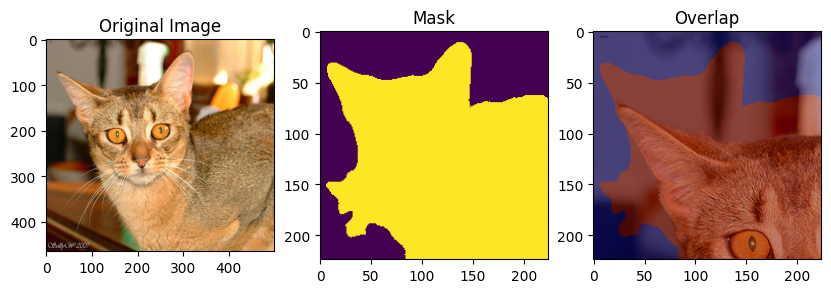

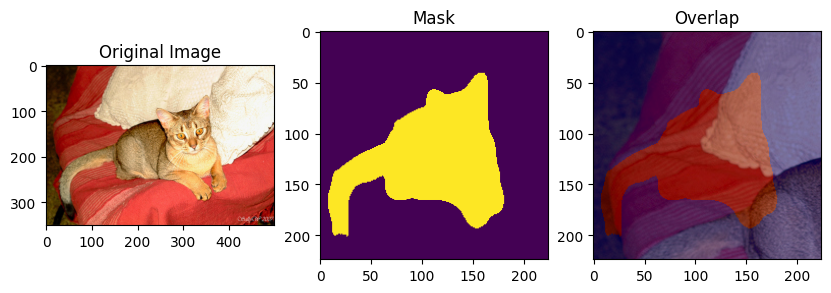

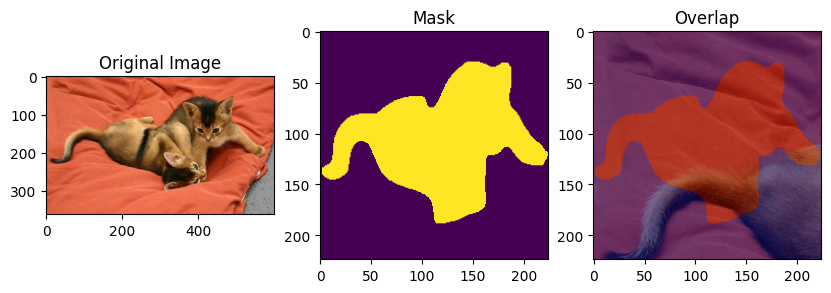

...

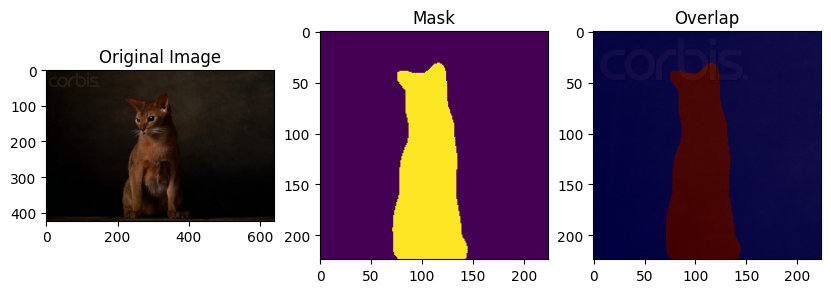

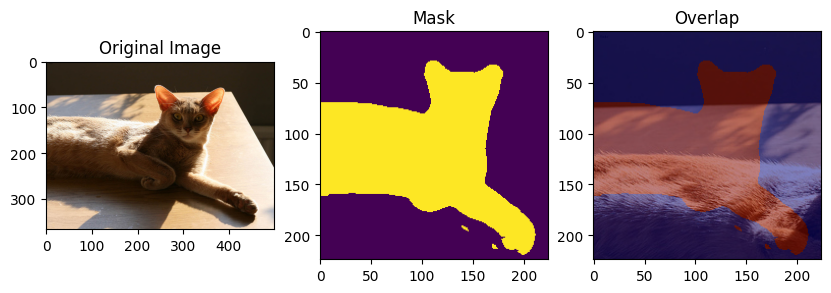

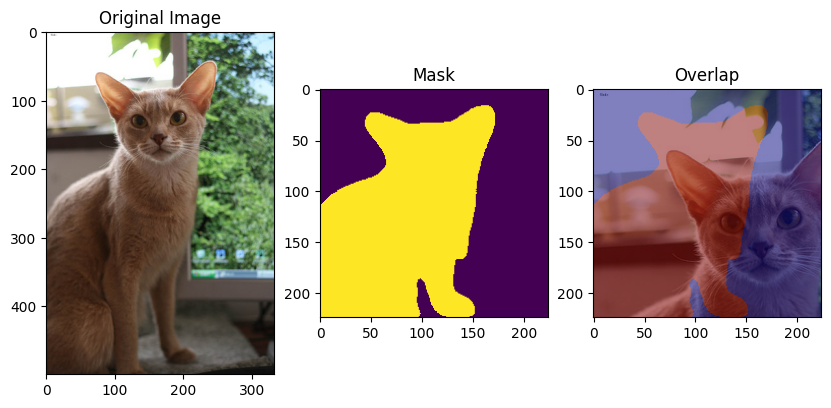

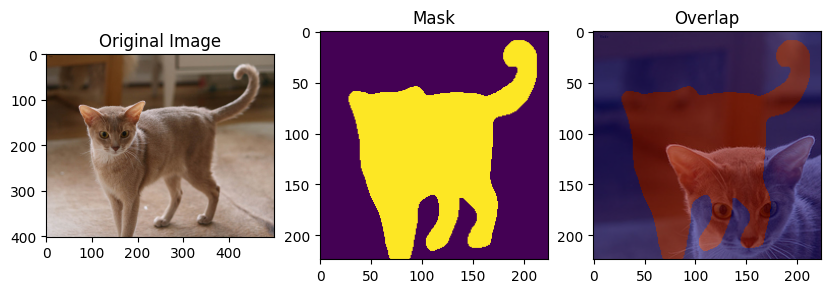

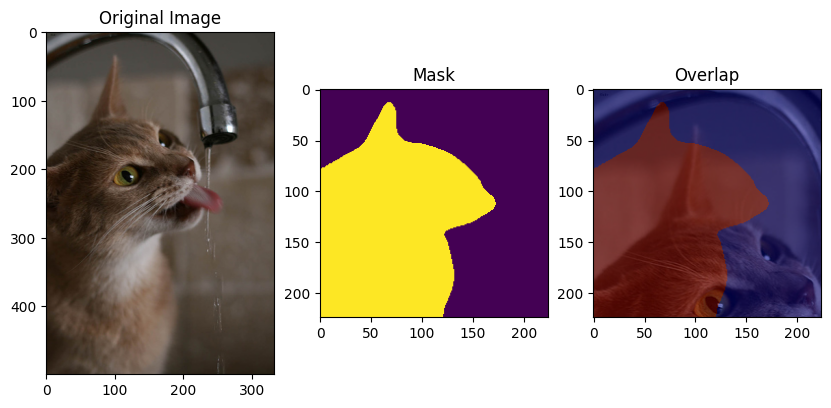

In [23]:
# Access the list of image names from the dataset
image_names_for_inference = train_dataset.img_names # Or val_dataset.img_names depending on which set you want to sample from
image_root = train_dataset.root # Or val_dataset.root

for i in range(20):
    # Construct the full image path using the root and image name
    sample_image = os.path.join(image_root, "images", image_names_for_inference[i]) + ".jpg"
    # You also need to pass the test_transform to infer_and_visualize
    infer_and_visualize(model, sample_image, device, test_transform)